# Notebook 2: Generate Residence Centroids, determine `d1` and visualize centroids and nearest OSMNx nodes

## Introduction to Notebook 2

Our goal within the next three notebooks is to derive the values of three distances from the:
1. `d1` - distance between a Parish residence centroid and the closest OSMNx node
2. `d2` - distance between a testing facility and the closest OSMNx node
3. `d3` - the shortest distance (and route) between the OSMNx nodes (parish residence and testing facility)

<img src="images/d1-d2-d3.jpeg" alt="d1-d2-d3 image" width="700"/>

## Data sources for this notebook

### Data Source: GADM

Download page: https://gadm.org/download_country_v3.html  Use GeoPackage link.

What is GeoPackage? https://www.geopackage.org/

### Download Uganda geopackage

In [1]:
import os

In [2]:
if not os.path.exists('data/gadm36_UGA.gpkg'):
    if not os.path.exists('data/gadm_gpkg.zip'):
        os.system('wget https://biogeo.ucdavis.edu/data/gadm3.6/gpkg/gadm36_UGA_gpkg.zip -O data/gadm_gpkg.zip')
    os.system('unzip data/gadm_gpkg.zip -d data')

### Load Uganda GeoPackage as a GeoPandas GeoDataFrame (GDF)

What is GeoPandas? https://geopandas.org/

What is the difference between Pandas and GeoPandas?

What is GADM? https://gadm.org/

In [3]:
import geopandas as gpd, pandas as pd

pd.options.display.float_format = '{:.10f}'.format

In [4]:
uganda_gdf = gpd.read_file('data/gadm36_UGA.gpkg')

uganda_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5341 entries, 0 to 5340
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   GID_0      5341 non-null   object  
 1   NAME_0     5341 non-null   object  
 2   GID_1      5341 non-null   object  
 3   NAME_1     5341 non-null   object  
 4   GID_2      5341 non-null   object  
 5   NAME_2     5341 non-null   object  
 6   GID_3      5341 non-null   object  
 7   NAME_3     5341 non-null   object  
 8   GID_4      5341 non-null   object  
 9   NAME_4     5341 non-null   object  
 10  VARNAME_4  0 non-null      object  
 11  TYPE_4     5341 non-null   object  
 12  ENGTYPE_4  5341 non-null   object  
 13  CC_4       0 non-null      object  
 14  geometry   5341 non-null   geometry
dtypes: geometry(1), object(14)
memory usage: 626.0+ KB


<AxesSubplot:>

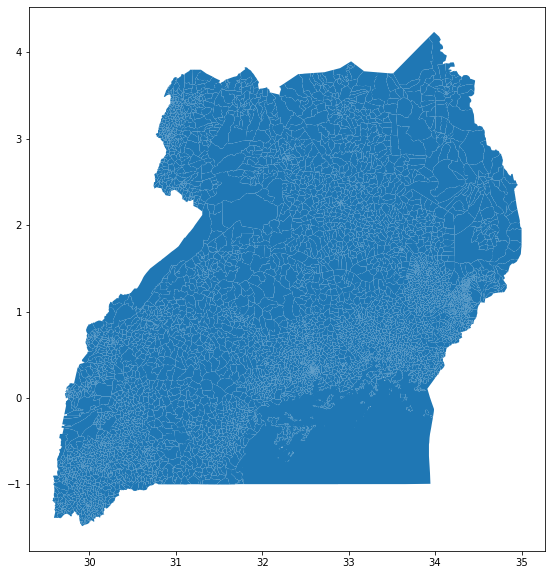

In [5]:
uganda_gdf.plot(figsize=(20, 10))

### Select a parish to study

In [6]:
parishes_gdf = uganda_gdf[uganda_gdf['NAME_1']=='Kampala'].copy()

In [7]:
parishes_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [8]:
import yaml

with open("proj_crs.yml", "r") as stream:
    try:
        epsg_dict = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
        
proj_epsg_str = str(epsg_dict).replace("{","").replace("}", "").replace("'","").replace(" ","")

print('Projected graph EPSG code:',proj_epsg_str)

Projected graph EPSG code: EPSG:32636


In [9]:
parishes_gdf['area_sqm'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].area

In [10]:
parishes_gdf['centroid_x'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].centroid.x
parishes_gdf['centroid_y'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].centroid.y

In [11]:
parishes_gdf

,GID_0,NAME_0,GID_1,NAME_1,GID_2,NAME_2,GID_3,NAME_3,GID_4,NAME_4,VARNAME_4,TYPE_4,ENGTYPE_4,CC_4,geometry,area_sqm,centroid_x,centroid_y
1391,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.1_1,Bukesa,None,Parish,Parish,None,"MULTIPOLYGON (((32.56321 0.31958, 32.56292 0.3...",559768.3975113713,451524.4166484834,35906.9724917396
1392,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.2_1,Civic Centre,None,Parish,Parish,None,"MULTIPOLYGON (((32.57724 0.30992, 32.57730 0.3...",1209455.8146584462,453884.4876301024,34880.4453069278
1393,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.3_1,Industrial Area,None,Parish,Parish,None,"MULTIPOLYGON (((32.60664 0.31585, 32.60598 0.3...",1776410.1888784864,455890.3457818956,35463.5391795589
1394,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.4_1,Kagugube,None,Parish,Parish,None,"MULTIPOLYGON (((32.57084 0.32427, 32.57058 0.3...",502708.6719317246,452030.8561209833,36273.6179740557
1395,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.5_1,Kamwokya I,None,Parish,Parish,None,"MULTIPOLYGON (((32.58500 0.34132, 32.58651 0.3...",411428.6768850113,454564.2625147337,38168.9266840896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.9_1,Nakulabye,None,Parish,Parish,None,"MULTIPOLYGON (((32.54860 0.33223, 32.55151 0.3...",1026084.8535207562,450559.2039879204,36410.2678852486
1483,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.10_1,Namirembe,None,Parish,Parish,None,"MULTIPOLYGON (((32.56114 0.30923, 32.56108 0.3...",1859599.6021243404,450911.3264704964,35032.9390910053
1484,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.11_1,Nateete,None,Parish,Parish,None,"MULTIPOLYGON (((32.54007 0.30528, 32.53991 0.3...",1804795.3528157366,448176.4503960741,33820.1469633023
1485,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.12_1,Ndeeba,None,Parish,Parish,None,"MULTIPOLYGON (((32.57188 0.29548, 32.57166 0.2...",1962463.6518844874,451649.7161646702,33182.2916360861


In [12]:
parishes_polygon = parishes_gdf.geometry.unary_union

parishes_coords = (parishes_polygon.centroid.y, parishes_polygon.centroid.x)

In [13]:
parishes_coords

(0.32245219939201997, 32.59300521351633)

### Folium parish explorer

In [14]:
import folium

from folium import plugins

m = folium.Map(location=parishes_coords, zoom_start=14, control_scale=True)

for _, r in parishes_gdf.iterrows():
    # Simplify the representation of the parishes
    #    so the polygons display easily
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.000001)
    # convert the simplified geometry to GeoJSON
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'color':'black','weight':2, 'fillColor': 'orange','fillOpacity':0.05},
                           highlight_function=lambda x: {'color':'black','weight':2, 'fillColor': 'blue','fillOpacity':0.075})
    folium.Popup('Parish: '+r['NAME_4']+'<br/>'+'Area (sq. m.): '+str(r['area_sqm'])).add_to(geo_j)
    geo_j.add_to(m)
    
m

### Create bounding parish polygon

In this section we will create the bounding parish polygon to enable us to create the data set that includes OSM building footprints for that parish. Downloading all building footprints for all parishes would consume a lot of resources (RAM) - for this initial exploration we will focus on one parish.

Parishes to try:
1. Kisugu (200+ residential units)
2. Bwaise I (1000+ residential units)
3. Bukasa (1300+ residential units)
4. Kawempe I (2500+ residential units)
5. Kazo Ward (3600+ residential units)

How many parishes are there in Kampala?

### Use IPython interactive widget for selection of target parish

In [15]:
from IPython.display import *
from ipywidgets import *

def f(parish_list):
    return parish_list

w = interactive(f, parish_list=parishes_gdf['NAME_4'].sort_values())
display(w)

interactive(children=(Dropdown(description='parish_list', options=('Banda', 'Bogolobi', 'Bukasa', 'Bukesa', 'B…

Let's store the widget result to `parish_name`.

In [16]:
parish_name = w.result

parish_name

'Kisugu'

In [17]:
parish_gdf = parishes_gdf[parishes_gdf['NAME_4']==parish_name].copy()

In [18]:
parish_polygon = parish_gdf['geometry'].unary_union

In [19]:
type(parish_polygon)

shapely.geometry.polygon.Polygon

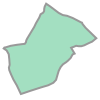

In [20]:
parish_polygon

In [21]:
parish_json = gpd.GeoSeries([parish_polygon]).__geo_interface__

In [22]:
parish_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Process OSMNx building footprints

### Set up OSMNx and Overpass API

What is OSMNx?

What is the Overpass API?

In [23]:
import osmnx as ox, csv, os

with open('overpass-api.csv', mode='r') as infile:
    reader = csv.reader(infile)
    overpass_api = {rows[0]:rows[1] for rows in reader}

ox.config(
    log_console=False, 
    use_cache=True, 
    log_file=True,
    overpass_endpoint=overpass_api['main']
)

### OSMNx building footprints in GeoPandas GeoDataFrame

References: 
1. OSMNx geometries from polygon: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_polygon
2. Open Street Map data model (nodes, ways, relations): https://labs.mapbox.com/mapping/osm-data-model/

In [24]:
# check if footprints_gdf exists:
if os.path.exists('data/footprints_gdf.gpkg'):
    footprints_gdf = gpd.read_file('data/footprints_gdf.gpkg')
else:
    footprints_gdf = gpd.GeoDataFrame()

if (footprints_gdf.empty) or (parish_name not in footprints_gdf['parish_name'].values):
    new_gdf = ox.geometries.geometries_from_polygon(parish_polygon, tags={'building':True}).reset_index()
    if 'nodes' in new_gdf.columns:
        new_gdf['nodes'] = new_gdf['nodes'].astype(str)
    if 'ways' in new_gdf.columns:
        new_gdf['ways'] = new_gdf['ways'].astype(str)
    new_gdf['parish_name'] = parish_name
    footprints_gdf = footprints_gdf.append(new_gdf, ignore_index=True)
    footprints_gdf.to_file('data/footprints_gdf.gpkg', driver='GPKG')

In [25]:
footprints_gdf['parish_name'].unique()

array(['Kisugu', 'Kasubi', 'Mutungo', 'Bukasa', 'Kibuye I', 'Ggaba',
       'Kabowa', 'Kawempe I', 'Bogolobi'], dtype=object)

### Using GeoPandas `explore()` (Folium Map)

Reference: https://geopandas.org/docs/user_guide/interactive_mapping.html

In [26]:
footprints_gdf[footprints_gdf['parish_name']==parish_name].explore()

### Select GeoDataFrame columns to use

In [27]:
filtered_buildings_gdf = footprints_gdf[footprints_gdf['parish_name']==parish_name][['parish_name','building','geometry']].copy()

### Select residential building types

What are building types in OSM? https://wiki.openstreetmap.org/wiki/Key:building

Let's look at the building types in this GDF.

In [28]:
filtered_buildings_gdf['building'].unique()

array(['yes', 'school', 'residential', 'dormitory', 'duplex',
       'Adult education', 'r', 'roof', 'apartments', 'house', 'ruins',
       'Bar', 'retail', 'church', 'clinic', 'supermarket', 'terrace',
       'commercial'], dtype=object)

Add anything new in the list above that looks like a residential unit to the `include_list` below. The building type `yes` are for untagged buildings - learn more about it from this page: https://wiki.openstreetmap.org/wiki/Tag:building%3Dyes. Note there may be misspelled terms.

In [29]:
include_list = ['residential', 'dormitory', 'duplex', 'apartments', 'apartment', 'house', \
                'Tent', 'tent', 'semidetached_house', 'bungalow', 'detached', 'terrace', \
                'hut','settlment']

If you include `yes` in the `include list` below, this will potentially include untagged commercial and other non-residential type buildings.

In [30]:
%%time

include_yes = False
if include_yes:
    residential_gdf = filtered_buildings_gdf[filtered_buildings_gdf['building'].isin(include_list + ['yes'])].copy()
    print('Records with "yes" building type:')
    print(residential_gdf.shape[0])
else:
    residential_gdf = filtered_buildings_gdf[filtered_buildings_gdf['building'].isin(include_list)].copy()
    print('Records without "yes" building type:')
    print(residential_gdf.shape[0])

Records without "yes" building type:
214
CPU times: user 3.33 ms, sys: 0 ns, total: 3.33 ms
Wall time: 2.85 ms


Let's clear some variables and recover memory resources. After this step `footprints_gdf` can no longer be used.

In [31]:
if 'footprints_gdf' in globals():
    del footprints_gdf 

In [32]:
residential_gdf.explore()

In [33]:
residential_gdf

,parish_name,building,geometry
10,Kisugu,residential,"POLYGON ((32.60823 0.30510, 32.60830 0.30505, ..."
16,Kisugu,dormitory,"POLYGON ((32.60815 0.30537, 32.60823 0.30544, ..."
17,Kisugu,duplex,"POLYGON ((32.60842 0.30460, 32.60853 0.30465, ..."
18,Kisugu,residential,"POLYGON ((32.60832 0.30456, 32.60836 0.30459, ..."
19,Kisugu,residential,"POLYGON ((32.60797 0.30467, 32.60804 0.30473, ..."
...,...,...,...
703,Kisugu,house,"POLYGON ((32.60824 0.30877, 32.60830 0.30871, ..."
704,Kisugu,house,"POLYGON ((32.60817 0.30888, 32.60823 0.30879, ..."
705,Kisugu,house,"POLYGON ((32.60799 0.30873, 32.60800 0.30872, ..."
1093,Kisugu,house,"POLYGON ((32.60812 0.30913, 32.60815 0.30905, ..."


In [34]:
residential_gdf.reset_index(inplace=True, drop=True)

residential_gdf

,parish_name,building,geometry
0,Kisugu,residential,"POLYGON ((32.60823 0.30510, 32.60830 0.30505, ..."
1,Kisugu,dormitory,"POLYGON ((32.60815 0.30537, 32.60823 0.30544, ..."
2,Kisugu,duplex,"POLYGON ((32.60842 0.30460, 32.60853 0.30465, ..."
3,Kisugu,residential,"POLYGON ((32.60832 0.30456, 32.60836 0.30459, ..."
4,Kisugu,residential,"POLYGON ((32.60797 0.30467, 32.60804 0.30473, ..."
...,...,...,...
209,Kisugu,house,"POLYGON ((32.60824 0.30877, 32.60830 0.30871, ..."
210,Kisugu,house,"POLYGON ((32.60817 0.30888, 32.60823 0.30879, ..."
211,Kisugu,house,"POLYGON ((32.60799 0.30873, 32.60800 0.30872, ..."
212,Kisugu,house,"POLYGON ((32.60812 0.30913, 32.60815 0.30905, ..."


### Set CRS to EPSG:4326

Why is it important to set a CRS for a GeoDataFrame (GDF)? https://geopandas.org/docs/user_guide/projections.html

In [35]:
residential_gdf.to_crs('EPSG:4326')

,parish_name,building,geometry
0,Kisugu,residential,"POLYGON ((32.60823 0.30510, 32.60830 0.30505, ..."
1,Kisugu,dormitory,"POLYGON ((32.60815 0.30537, 32.60823 0.30544, ..."
2,Kisugu,duplex,"POLYGON ((32.60842 0.30460, 32.60853 0.30465, ..."
3,Kisugu,residential,"POLYGON ((32.60832 0.30456, 32.60836 0.30459, ..."
4,Kisugu,residential,"POLYGON ((32.60797 0.30467, 32.60804 0.30473, ..."
...,...,...,...
209,Kisugu,house,"POLYGON ((32.60824 0.30877, 32.60830 0.30871, ..."
210,Kisugu,house,"POLYGON ((32.60817 0.30888, 32.60823 0.30879, ..."
211,Kisugu,house,"POLYGON ((32.60799 0.30873, 32.60800 0.30872, ..."
212,Kisugu,house,"POLYGON ((32.60812 0.30913, 32.60815 0.30905, ..."


### Obtain Residence Centroids

What is a centroid? 

In [36]:
residential_centroids_gdf = residential_gdf.copy()

In [37]:
residential_centroids_gdf['geometry'] = residential_centroids_gdf['geometry'].centroid

residential_centroids_gdf

/tmp/ipykernel_18721/1830439308.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['geometry'] = residential_centroids_gdf['geometry'].centroid


,parish_name,building,geometry
0,Kisugu,residential,POINT (32.60825 0.30505)
1,Kisugu,dormitory,POINT (32.60825 0.30534)
2,Kisugu,duplex,POINT (32.60850 0.30457)
3,Kisugu,residential,POINT (32.60836 0.30454)
4,Kisugu,residential,POINT (32.60802 0.30468)
...,...,...,...
209,Kisugu,house,POINT (32.60822 0.30869)
210,Kisugu,house,POINT (32.60816 0.30881)
211,Kisugu,house,POINT (32.60805 0.30873)
212,Kisugu,house,POINT (32.60818 0.30910)


In [38]:
residential_centroids_gdf['lat'] = residential_centroids_gdf.centroid.y
residential_centroids_gdf['lon'] = residential_centroids_gdf.centroid.x

residential_centroids_gdf

/tmp/ipykernel_18721/3520687935.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['lat'] = residential_centroids_gdf.centroid.y
/tmp/ipykernel_18721/3520687935.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['lon'] = residential_centroids_gdf.centroid.x


,parish_name,building,geometry,lat,lon
0,Kisugu,residential,POINT (32.60825 0.30505),0.3050501833,32.6082495446
1,Kisugu,dormitory,POINT (32.60825 0.30534),0.3053414841,32.6082456333
2,Kisugu,duplex,POINT (32.60850 0.30457),0.3045664193,32.6084960943
3,Kisugu,residential,POINT (32.60836 0.30454),0.3045408000,32.6083606500
4,Kisugu,residential,POINT (32.60802 0.30468),0.3046784338,32.6080187078
...,...,...,...,...,...
209,Kisugu,house,POINT (32.60822 0.30869),0.3086906479,32.6082211451
210,Kisugu,house,POINT (32.60816 0.30881),0.3088099936,32.6081564965
211,Kisugu,house,POINT (32.60805 0.30873),0.3087290884,32.6080501563
212,Kisugu,house,POINT (32.60818 0.30910),0.3090996240,32.6081822843


In [39]:
residential_centroids_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Create analysis columns

### Create projected lat/lon columns

In [40]:
import yaml

with open("proj_crs.yml", "r") as stream:
    try:
        epsg_dict = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
        
proj_epsg_str = str(epsg_dict).replace("{","").replace("}", "").replace("'","").replace(" ","")

print('Projected graph EPSG code:',proj_epsg_str)

Projected graph EPSG code: EPSG:32636


Reference for 32636: https://epsg.io/32636

In [41]:
residential_centroids_proj_gdf = residential_centroids_gdf.to_crs(proj_epsg_str)

residential_centroids_proj_gdf.crs

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Turkey. Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [42]:
residential_centroids_proj_gdf

,parish_name,building,geometry,lat,lon
0,Kisugu,residential,POINT (456408.254 33718.007),0.3050501833,32.6082495446
1,Kisugu,dormitory,POINT (456407.820 33750.206),0.3053414841,32.6082456333
2,Kisugu,duplex,POINT (456435.687 33664.535),0.3045664193,32.6084960943
3,Kisugu,residential,POINT (456420.616 33661.704),0.3045408000,32.6083606500
4,Kisugu,residential,POINT (456382.566 33676.918),0.3046784338,32.6080187078
...,...,...,...,...,...
209,Kisugu,house,POINT (456405.109 34120.398),0.3086906479,32.6082211451
210,Kisugu,house,POINT (456397.916 34133.590),0.3088099936,32.6081564965
211,Kisugu,house,POINT (456386.082 34124.648),0.3087290884,32.6080501563
212,Kisugu,house,POINT (456400.786 34165.603),0.3090996240,32.6081822843


In [43]:
residential_centroids_proj_gdf['prj_lat'] = residential_centroids_proj_gdf.geometry.y
residential_centroids_proj_gdf['prj_lon'] = residential_centroids_proj_gdf.geometry.x

In [44]:
residential_centroids_proj_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon
0,Kisugu,residential,POINT (456408.254 33718.007),0.3050501833,32.6082495446,33718.0074585697,456408.2543575270
1,Kisugu,dormitory,POINT (456407.820 33750.206),0.3053414841,32.6082456333,33750.2057395246,456407.8202964029
2,Kisugu,duplex,POINT (456435.687 33664.535),0.3045664193,32.6084960943,33664.5347349995,456435.6874821403
3,Kisugu,residential,POINT (456420.616 33661.704),0.3045408000,32.6083606500,33661.7035135770,456420.6156729474
4,Kisugu,residential,POINT (456382.566 33676.918),0.3046784338,32.6080187078,33676.9179346887,456382.5662585886
...,...,...,...,...,...,...,...
209,Kisugu,house,POINT (456405.109 34120.398),0.3086906479,32.6082211451,34120.3978818522,456405.1089029149
210,Kisugu,house,POINT (456397.916 34133.590),0.3088099936,32.6081564965,34133.5897534508,456397.9155612630
211,Kisugu,house,POINT (456386.082 34124.648),0.3087290884,32.6080501563,34124.6475147437,456386.0821231636
212,Kisugu,house,POINT (456400.786 34165.603),0.3090996240,32.6081822843,34165.6032674131,456400.7863013543


In [45]:
residential_centroids_4326_gdf = residential_centroids_proj_gdf.to_crs('EPSG:4326')

residential_centroids_4326_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [46]:
residential_centroids_4326_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon
0,Kisugu,residential,POINT (32.60825 0.30505),0.3050501833,32.6082495446,33718.0074585697,456408.2543575270
1,Kisugu,dormitory,POINT (32.60825 0.30534),0.3053414841,32.6082456333,33750.2057395246,456407.8202964029
2,Kisugu,duplex,POINT (32.60850 0.30457),0.3045664193,32.6084960943,33664.5347349995,456435.6874821403
3,Kisugu,residential,POINT (32.60836 0.30454),0.3045408000,32.6083606500,33661.7035135770,456420.6156729474
4,Kisugu,residential,POINT (32.60802 0.30468),0.3046784338,32.6080187078,33676.9179346887,456382.5662585886
...,...,...,...,...,...,...,...
209,Kisugu,house,POINT (32.60822 0.30869),0.3086906479,32.6082211451,34120.3978818522,456405.1089029149
210,Kisugu,house,POINT (32.60816 0.30881),0.3088099936,32.6081564965,34133.5897534508,456397.9155612630
211,Kisugu,house,POINT (32.60805 0.30873),0.3087290884,32.6080501563,34124.6475147437,456386.0821231636
212,Kisugu,house,POINT (32.60818 0.30910),0.3090996240,32.6081822843,34165.6032674131,456400.7863013543


In [47]:
%%time
if 'G_proj' not in globals():
    G_proj = ox.load_graphml('data/g_projected.graphml')

CPU times: user 21.9 s, sys: 781 ms, total: 22.7 s
Wall time: 22.6 s


### Compute d1 and euclidean distance between origin point for residence centroid and OSMNx node

References:
1. OSMNx Distance - Nearest Nodes: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.distance.nearest_nodes
2. OSMNx Distance - Vectorized Euclidean Distance: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.distance.euclidean_dist_vec
2. tqdm: https://github.com/tqdm/tqdm

The Python code below may take a few minutes (200+ residential units) to an hour or more (3000+ residential units) to complete.

In [48]:
%%time

from tqdm import tqdm, notebook

residential_centroids_4326_gdf['r_node'] = 0
residential_centroids_4326_gdf['r_node_lat'] = 0.0
residential_centroids_4326_gdf['r_node_lon'] = 0.0
residential_centroids_4326_gdf['r_node_y'] = 0.0
residential_centroids_4326_gdf['r_node_x'] = 0.0
residential_centroids_4326_gdf['d1'] = 0.0
residential_centroids_4326_gdf['d1_euc'] = 0.0

# tqdm parameters
total_rows=residential_centroids_4326_gdf.shape[0]

for index, r_row in tqdm(residential_centroids_4326_gdf.iterrows(), total=total_rows):
    r_node, d1 = ox.distance.nearest_nodes(G_proj, r_row['prj_lon'], r_row['prj_lat'], return_dist=True)
    r_node_y = G_proj.nodes[r_node]['y']
    r_node_x = G_proj.nodes[r_node]['x']
    r_node_lat = G_proj.nodes[r_node]['lat']
    r_node_lon = G_proj.nodes[r_node]['lon']
    d1_euc = ox.distance.euclidean_dist_vec(r_row['prj_lat'], r_row['prj_lon'], r_node_y, r_node_x)
    residential_centroids_4326_gdf.loc[index, 'r_node'] = r_node
    residential_centroids_4326_gdf.loc[index, 'r_node_lat'] = r_node_lat
    residential_centroids_4326_gdf.loc[index, 'r_node_lon'] = r_node_lon
    residential_centroids_4326_gdf.loc[index, 'r_node_y'] = r_node_y
    residential_centroids_4326_gdf.loc[index, 'r_node_x'] = r_node_x
    residential_centroids_4326_gdf.loc[index, 'd1'] = d1
    residential_centroids_4326_gdf.loc[index, 'd1_euc'] = d1_euc

    r_dict = {'r_lat':r_row['lat'], 'r_lon':r_row['lon'], 'r_node':r_node, \
              'r_node_lat':r_node_lat, 'r_node_lon':r_node_lon, \
              'r_node_y':r_node_y, 'r_node_x':r_node_x, 'd1':d1, 'd1_euc': d1_euc}
    
    #print(r_dict)

100%|██████████| 214/214 [02:34<00:00,  1.39it/s]

CPU times: user 2min 34s, sys: 220 ms, total: 2min 34s
Wall time: 2min 34s


In [49]:
residential_centroids_4326_gdf['r_node'] = residential_centroids_4326_gdf['r_node'].astype(int)

residential_centroids_4326_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon,r_node,r_node_lat,r_node_lon,r_node_y,r_node_x,d1,d1_euc
0,Kisugu,residential,POINT (32.60825 0.30505),0.3050501833,32.6082495446,33718.0074585697,456408.2543575270,6227266298,0.3045983000,32.6083010000,33668.0593837221,456413.9782893857,50.2749796310,50.2749796310
1,Kisugu,dormitory,POINT (32.60825 0.30534),0.3053414841,32.6082456333,33750.2057395246,456407.8202964029,579993314,0.3055411000,32.6084585000,33772.2689535378,456431.5080539904,32.3712105445,32.3712105445
2,Kisugu,duplex,POINT (32.60850 0.30457),0.3045664193,32.6084960943,33664.5347349995,456435.6874821403,6227266298,0.3045983000,32.6083010000,33668.0593837221,456413.9782893857,21.9934580881,21.9934580881
3,Kisugu,residential,POINT (32.60836 0.30454),0.3045408000,32.6083606500,33661.7035135770,456420.6156729474,6227266298,0.3045983000,32.6083010000,33668.0593837221,456413.9782893857,9.1897739823,9.1897739823
4,Kisugu,residential,POINT (32.60802 0.30468),0.3046784338,32.6080187078,33676.9179346887,456382.5662585886,6227266299,0.3045855000,32.6082708000,33666.6446875843,456410.6177021883,29.8734513255,29.8734513255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209,Kisugu,house,POINT (32.60822 0.30869),0.3086906479,32.6082211451,34120.3978818522,456405.1089029149,579993370,0.3084251000,32.6083627000,34091.0455836289,456420.8594871131,33.3112340446,33.3112340446
210,Kisugu,house,POINT (32.60816 0.30881),0.3088099936,32.6081564965,34133.5897534508,456397.9155612630,1460122475,0.3091566000,32.6080193000,34171.9016473888,456382.6502965369,41.2411144888,41.2411144888
211,Kisugu,house,POINT (32.60805 0.30873),0.3087290884,32.6080501563,34124.6475147437,456386.0821231636,579993372,0.3083446000,32.6082158000,34082.1483045059,456404.5127182511,46.3235329624,46.3235329624
212,Kisugu,house,POINT (32.60818 0.30910),0.3090996240,32.6081822843,34165.6032674131,456400.7863013543,6226990677,0.3092163000,32.6081950000,34178.4997268183,456402.2017287260,12.9739007177,12.9739007177


## Map Residence Centroids and OSMNx nodes

What is folium? https://python-visualization.github.io/folium/

In [50]:
import folium
from folium import plugins

map1 = residential_centroids_4326_gdf.explore(
    marker_kwds=dict(radius=5))

# Tile Layer (can add more, these become radio buttons on Layer Control)
folium.TileLayer('cartodbpositron').add_to(map1)

# Feature groups become checkboxes in Layer Control Widget
fg0=folium.FeatureGroup(name='Parish Boundary', show=False)
fg1=folium.FeatureGroup(name='Residences', show=False)
fg2=folium.FeatureGroup(name='Residence Nodes', show=False)
fg3=folium.FeatureGroup(name='Residence to Node', show=False)

# GeoJSON parish boundary with style function
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0, 
                            'weight': 3}
folium.GeoJson(
    data=parish_gdf['geometry'], 
    name="geojson",
    style_function=style_function
).add_to(fg0)

# Residences, Nodes and Residence-to-Node Paths
for index,row in residential_centroids_4326_gdf.iterrows():

    folium.CircleMarker(
                    location=[row['lat'],row['lon']], \
                    radius=4, \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    fill_color='red', \
                    fill_opacity=1).add_to(fg1)


    folium.CircleMarker(
                    location=[row['r_node_lat'],row['r_node_lon']], \
                    radius=4, \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    fill_color='yellow', \
                    fill_opacity=1).add_to(fg2)
    
    r_line_points = ((row['lat'],row['lon']),(row['r_node_lat'],row['r_node_lon']))
    popup_d1 = folium.Popup(str(row['d1'])+' meters')
    folium.PolyLine(r_line_points,
                    color='gray',
                    popup=popup_d1,
                    weight=2,
                    opacity=0.8
                   ).add_to(fg3)

fg0.add_to(map1)
fg1.add_to(map1)
fg2.add_to(map1)
fg3.add_to(map1)

# Layer Control
folium.LayerControl(position='topright', collapsed=True, autoZIndex=True).add_to(map1)

map1.add_child(plugins.MeasureControl())

# Full Screen button
plugins.Fullscreen(
    position='topright',
    title='Expand me',
    title_cancel='Exit me',
    force_separate_button=True
).add_to(map1)

map1

## Housecleaning

How do we save GeoDataFrames to disk?

In [51]:
residential_centroids_4326_gdf.to_file('data/residential_centroids_4326_gdf.gpkg', driver='GPKG')

In [52]:
if os.path.exists('data/residential_centroids_cache_gdf.gpkg'):
    residential_centroids_cache_gdf = gpd.read_file('data/residential_centroids_cache_gdf.gpkg')
else:
    residential_centroids_cache_gdf = gpd.GeoDataFrame()

if (residential_centroids_cache_gdf.empty) or (parish_name not in residential_centroids_cache_gdf['parish_name'].values):
    residential_centroids_cache_gdf = residential_centroids_cache_gdf.append(residential_centroids_4326_gdf, ignore_index=True)
    residential_centroids_cache_gdf.to_file('data/residential_centroids_cache_gdf.gpkg', driver='GPKG')

residential_centroids_cache_gdf['parish_name'].unique()

array(['Ggaba', 'Kisugu', 'Kabowa', 'Kawempe I', 'Bogolobi'], dtype=object)

In [53]:
uganda_gdf.to_file('data/uganda_gdf.gpkg', driver='GPKG')

In [54]:
parish_gdf.to_file('data/parish_gdf.gpkg', driver='GPKG')

In [55]:
parishes_gdf.to_file('data/parishes_gdf.gpkg', driver='GPKG')